In [180]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from time import time
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')

In [234]:
data = pd.read_csv('diabetes_.csv')
data.shape

(768, 9)

In [235]:
data = pd.read_csv('diabetes.csv')
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [183]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [5]:
data.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [5]:
import pandas_profiling
data.profile_report(title="Diabetes Data")

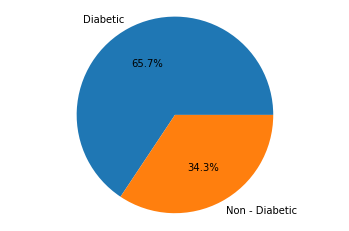

Percentage of people having Diabetes 65%
Percentage of people dosen't having Diabetes 34%


In [6]:
label = ['Diabetic' , 'Non - Diabetic' ]
sizes = [int(len(data[data.Outcome == 0])/len(data) * 100) , int(len(data[data.Outcome == 1])/len(data) * 100)]

plt.pie(sizes, labels=label , autopct = "%.1f%%")
plt.axis('equal')
plt.show()
print("Percentage of people having Diabetes {}%".format(int(len(data[data.Outcome == 0])/len(data) * 100)))
print("Percentage of people dosen't having Diabetes {}%".format(int(len(data[data.Outcome == 1])/len(data) * 100)))

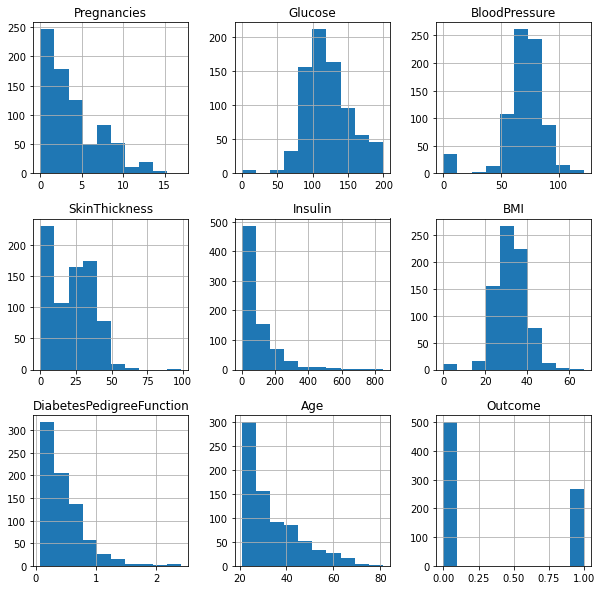

In [7]:
data.hist(figsize = (10,10))
plt.show()

In [7]:
data.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [8]:
print("total number of rows : {0}".format(len(data)))
print("number of rows missing glucose: {0}".format(len(data.loc[data['Glucose'] == 0])))
print("number of rows missing blood pressure: {0}".format(len(data.loc[data['BloodPressure'] == 0])))
print("number of rows missing skin: {0}".format(len(data.loc[data['SkinThickness'] == 0])))
print("number of rows missing bmi: {0}".format(len(data.loc[data['BMI'] == 0])))
print("number of rows missing insulin: {0}".format(len(data.loc[data['Insulin'] == 0])))
print("number of rows missing age: {0}".format(len(data.loc[data['Age'] == 0])))

total number of rows : 768
number of rows missing glucose: 5
number of rows missing blood pressure: 35
number of rows missing skin: 227
number of rows missing bmi: 11
number of rows missing insulin: 374
number of rows missing age: 0


In [184]:
from scipy.stats import shapiro
for col in data.columns[:8]:
    stat,p = shapiro(data[col])
    print('Statistics=%.3f, p=%.3f' % (stat, p), col)

Statistics=0.904, p=0.000 Pregnancies
Statistics=0.970, p=0.000 Glucose
Statistics=0.819, p=0.000 BloodPressure
Statistics=0.905, p=0.000 SkinThickness
Statistics=0.722, p=0.000 Insulin
Statistics=0.950, p=0.000 BMI
Statistics=0.837, p=0.000 DiabetesPedigreeFunction
Statistics=0.875, p=0.000 Age


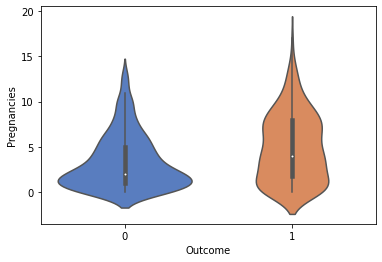

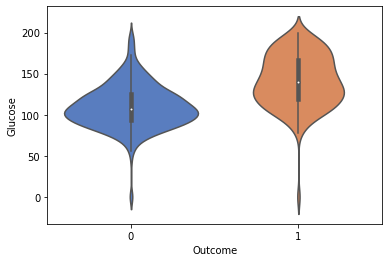

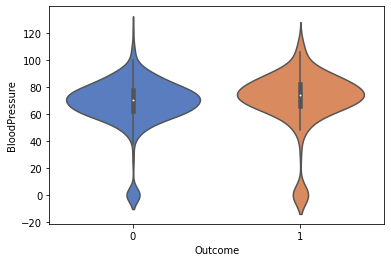

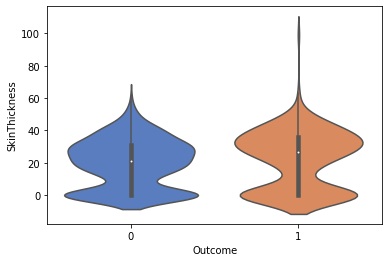

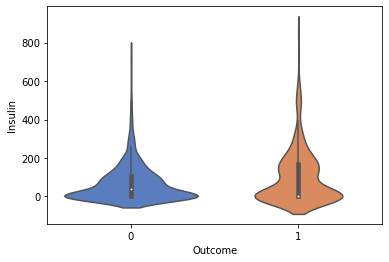

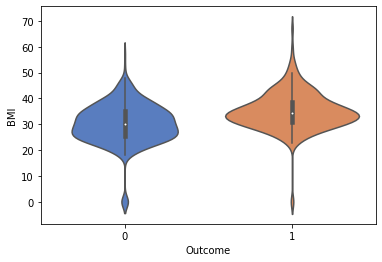

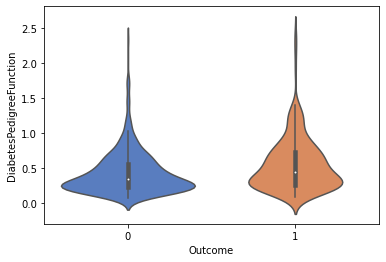

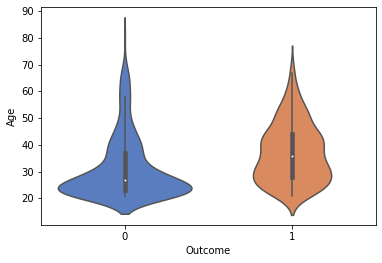

In [10]:
for col in data.columns[:8]:
    ax = sns.violinplot(x="Outcome", y=col , data=data, palette="muted", split=True)
    plt.show()

In [185]:
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from numpy import mean, std
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold

X = data.drop(['Outcome'], axis=1)
y = data.Outcome
results = list()
strategies = ['mean', 'median', 'most_frequent', 'constant']
for s in strategies:
    # create the modeling pipeline
    pipeline = Pipeline(steps=[('i', SimpleImputer(missing_values = 0, strategy=s)), ('m', RandomForestClassifier())])
    # evaluate the model
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(pipeline, X, y, scoring='accuracy', cv=3, n_jobs=-1)
    # store results
    results.append(scores)
    print('>%s %.3f (%.3f)' % (s, mean(scores), std(scores)))

>mean 0.749 (0.018)
>median 0.755 (0.019)
>most_frequent 0.755 (0.025)
>constant 0.767 (0.027)


In [13]:
import sklearn
print(sklearn.__version__)

0.24.1


In [236]:
from sklearn.impute import SimpleImputer

cols = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']
fill_values = SimpleImputer(missing_values=0, strategy="mean")

data[cols] = fill_values.fit_transform(data[cols])

In [187]:
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,125.0,33.6,0.627,50,1
1,1,85.0,66.0,29.0,125.0,26.6,0.351,31,0
2,8,183.0,64.0,29.0,125.0,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1


<AxesSubplot:>

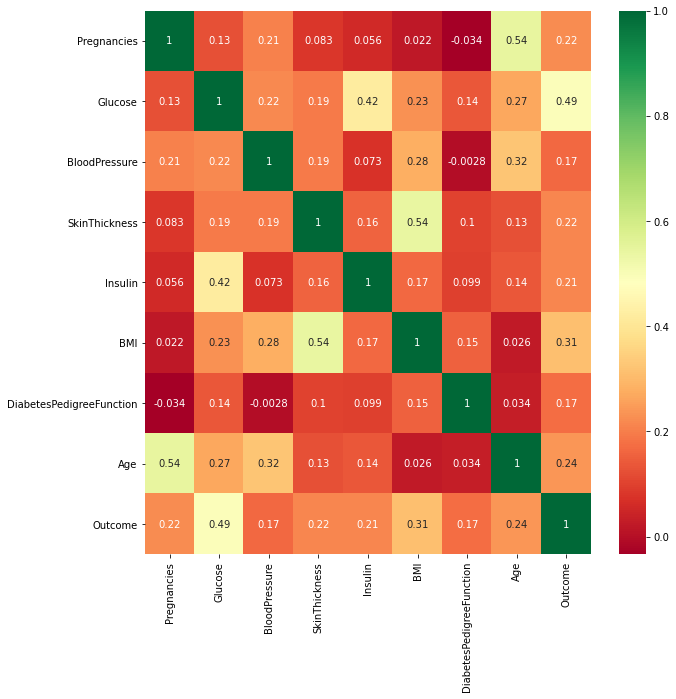

In [81]:
plt.figure(figsize = (10,10))
sns.heatmap(data.corr() , annot = True , cmap="RdYlGn")

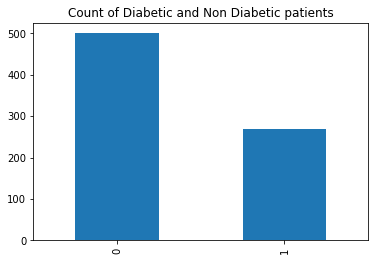

In [82]:
data.Outcome.value_counts().plot(kind = 'bar')
plt.title('Count of Diabetic and Non Diabetic patients')
plt.show()


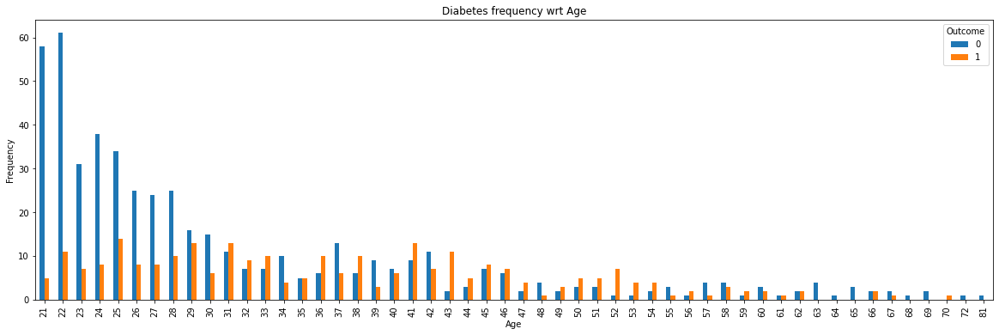

In [83]:
pd.crosstab(data.Age, data.Outcome).plot(kind = 'bar',figsize=(20,6))
plt.title('Diabetes frequency wrt Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

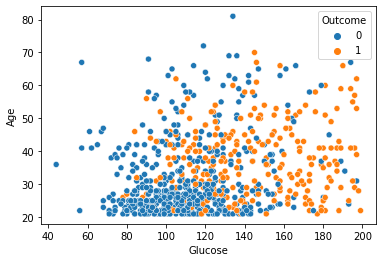

In [84]:
fig = sns.scatterplot(data.Glucose, data.Age , hue = data.Outcome)

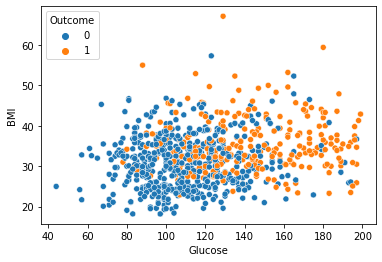

In [85]:
fig = sns.scatterplot(data.Glucose, data.BMI, hue = data.Outcome)

<AxesSubplot:>

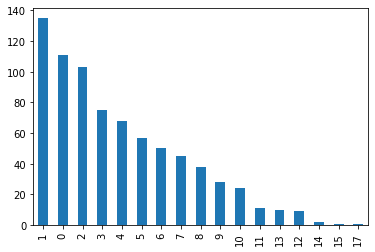

In [86]:
data.Pregnancies.value_counts().plot(kind = 'bar')

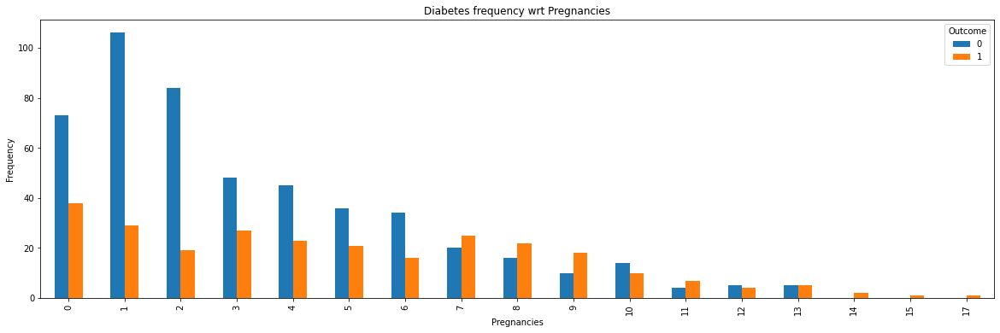

In [87]:
pd.crosstab(data.Pregnancies, data.Outcome).plot(kind = 'bar',figsize=(20,6))
plt.title('Diabetes frequency wrt Pregnancies')
plt.xlabel('Pregnancies')
plt.ylabel('Frequency')
plt.show()

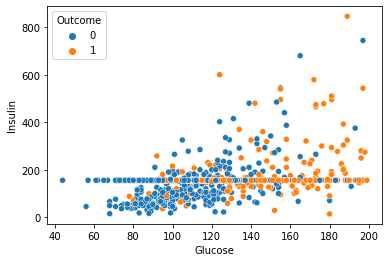

In [88]:
fig = sns.scatterplot(data.Glucose, data.Insulin, hue = data.Outcome)

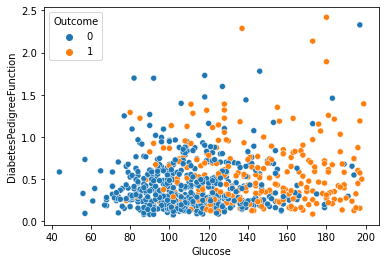

In [89]:
fig = sns.scatterplot(data.Glucose, data.DiabetesPedigreeFunction, hue = data.Outcome)

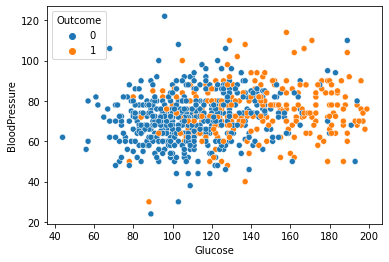

In [90]:
fig = sns.scatterplot(data.Glucose, data.BloodPressure, hue = data.Outcome)

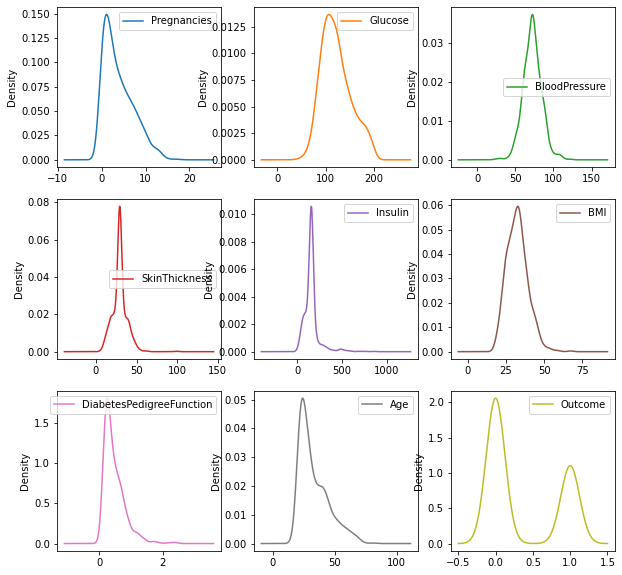

In [91]:
data.plot(kind='density', subplots=True, layout=(3,3), sharex=False , figsize =(10,10))
plt.show()

In [237]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.feature_selection import mutual_info_classif

X_train, X_test, y_train, y_test = train_test_split(data.drop(['Outcome'], axis = 1), 
                                                   data.Outcome, 
                                                   test_size = 0.2,
                                                   random_state = 20)

print("Training set has {} samples.".format(X_train.shape[0]))
print("Testing set has {} samples.".format(X_test.shape[0]))

Training set has 614 samples.
Testing set has 154 samples.


### Standardization

In [191]:
from sklearn.preprocessing import StandardScaler


#initializing the scaler function 
scaler = StandardScaler()
scaler.fit(X_train)
#fitting and transposing all the numerical features
X_train[:] = scaler.transform(X_train[:])
X_test[:] = scaler.transform(X_test[:])

In [239]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.feature_selection import mutual_info_classif

mutual_info = mutual_info_classif(X_train, y_train)
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending = False)
    

Glucose                     0.130062
BMI                         0.092735
Age                         0.050142
Insulin                     0.044588
SkinThickness               0.035005
DiabetesPedigreeFunction    0.014555
Pregnancies                 0.006743
BloodPressure               0.000236
dtype: float64

<AxesSubplot:>

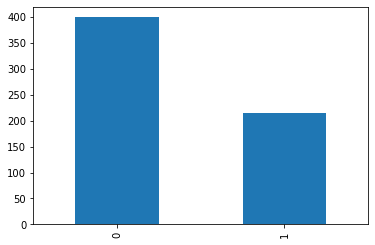

In [193]:
y_train.value_counts().plot(kind='bar')

### Normalization

In [238]:
#import MinMaxScaler from sklearn to normalize the numerical features
from sklearn.preprocessing import MinMaxScaler


#initializing the scaler function 
scaler = MinMaxScaler()
scaler.fit(X_train[:])
#fitting and transposing all the numerical features
X_train[:] = scaler.transform(X_train[:])
X_test[:] = scaler.transform(X_test[:])

In [240]:
from imblearn.over_sampling import SMOTE
smt = SMOTE()
X_train, y_train = smt.fit_sample(X_train, y_train)
np.bincount(y_train)

array([399, 399], dtype=int64)

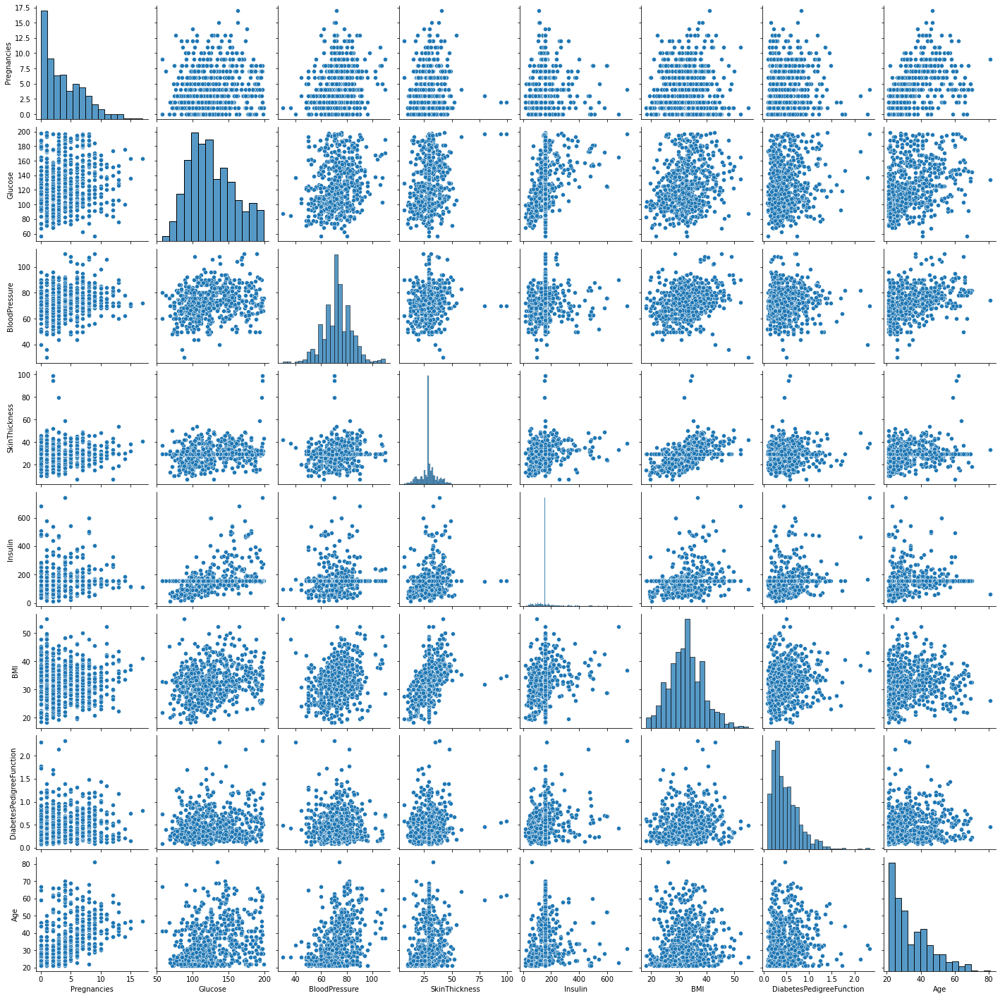

In [41]:
sns.pairplot(X_train)

In [19]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier

In [195]:
from sklearn.metrics import fbeta_score , accuracy_score
def train_predict(learner, sample_size, X_train, y_train, X_test, y_test): 
    results = {}
    
    start = time() 
    learner = learner.fit(X_train[:sample_size] , y_train[:sample_size])
    end = time()
    results['train_time'] = end - start
    
    start = time()
    predictions_test = learner.predict(X_test)
    predictions_train = learner.predict(X_train[:300])
    end = time() 
    results['pred_time'] = end - start
    
    results['acc_train'] = accuracy_score(y_train[:300] , predictions_train)
    results['acc_test'] = accuracy_score(y_test , predictions_test)
    results['f_train'] = fbeta_score(y_train[:300] , predictions_train , 0.5)
    results['f_test'] = fbeta_score(y_test , predictions_test , 0.5)
    
    print("{} trained on {} samples.".format(learner.__class__.__name__, sample_size))
    return results

In [196]:
#function to plot the feature weight and cumulative weight of top 6 most predictive features 
#passing feature importance of a particular model
def feature_plot(importances, X_train, y_train):
    
    indices = np.argsort(importances)[::-1]
    columns = X_train.columns.values[indices[:6]]
    values = importances[indices][:6]

    fig = plt.figure(figsize = (9,6))
    plt.title("Normalized Weights for First Six Most Predictive Features", fontsize = 12)
    plt.bar(np.arange(6), values, width = 0.4, align="center", color = '#00A000', label = "Feature Weight")
    plt.bar(np.arange(6) - 0.3, np.cumsum(values), width = 0.3, align = "center", color = '#00A0A0', label = "Cumulative Feature Weight")
    plt.xticks(np.arange(6), columns)
    plt.xlim((-0.5, 6))
    plt.ylabel("Weight", fontsize = 12)
    plt.xlabel("Feature", fontsize = 12)
    
    plt.legend(loc = 'upper center')
    plt.tight_layout()
    plt.show()  

In [197]:
#function to get the feature importance according to a particular model
def get_features(model):
    #getting all the columns name
    feature = X_train.columns
    #creating a series containing the percentage of importance that is shown by a particular  
    #column in predicting the target feature(delay)
    feature_importance = pd.Series(model.feature_importances_, index=feature).to_dict()
    x = sorted(feature_importance.items(), key=lambda x: x[1], reverse=True)
    for name, importance in x:
        print(f"{name:<30}: {importance:>6.2%}")
  
    #printing the feature importance in a sorted order
    print(f"\nTotal importance: {sum(feature_importance.values()):.2%}")
    return feature_importance

In [241]:
from sklearn.svm import SVC
clf = LogisticRegression()
clf1 = RandomForestClassifier()
clf2 = GradientBoostingClassifier()
clf3 = KNeighborsClassifier()
clf4 = SVC()

samples_100 = len(X_train)

results = {}
for clf in [clf, clf1, clf2, clf3, clf4]:
    clf_name = clf.__class__.__name__
    results[clf_name] = {}
    results[clf_name] = train_predict(clf, samples_100, X_train, y_train, X_test, y_test)

LogisticRegression trained on 798 samples.
RandomForestClassifier trained on 798 samples.
GradientBoostingClassifier trained on 798 samples.
KNeighborsClassifier trained on 798 samples.
SVC trained on 798 samples.


In [242]:
'''for iterator in results.items():
    print(iterator[0])
    display(pd.DataFrame(iterator[1]).rename(columns = {0:'100%'}))'''
display(pd.DataFrame(results))

,LogisticRegression,RandomForestClassifier,GradientBoostingClassifier,KNeighborsClassifier,SVC
train_time,0.009973,0.244346,0.155586,0.002990,0.019944
pred_time,0.003990,0.027967,0.003985,0.018949,0.021978
acc_train,0.786667,0.996667,0.920000,0.826667,0.820000
acc_test,0.753247,0.733766,0.746753,0.688312,0.753247
f_train,0.704809,0.992844,0.880829,0.735502,0.741627
f_test,0.639344,0.613383,0.631229,0.566572,0.638978


In [243]:
knn_scores = []
for k in range(1,21):
    clf = KNeighborsClassifier(n_neighbors = k)
    score = cross_val_score(clf , X_train,y_train,cv=10)
    knn_scores.append(score.mean())

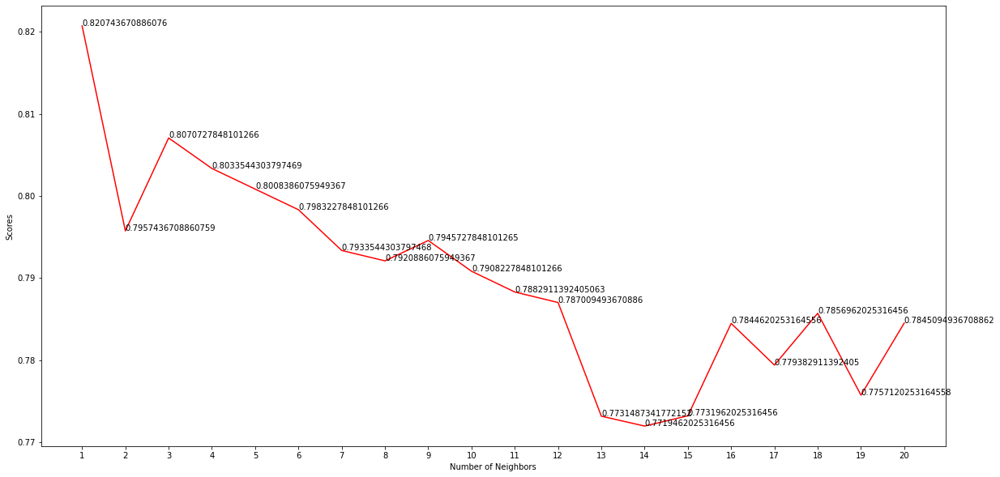

In [244]:
plt.figure(figsize = (20,10))
plt.plot([k for k in range(1,21)], knn_scores, color= 'red')
for i in range(1,21):
    plt.text(i , knn_scores[i-1], knn_scores[i-1])
plt.xticks([i for i in range(1,21)])
plt.xlabel('Number of Neighbors')
plt.ylabel('Scores')
plt.show()

In [245]:
knn_scores

[0.820743670886076,
 0.7957436708860759,
 0.8070727848101266,
 0.8033544303797469,
 0.8008386075949367,
 0.7983227848101266,
 0.7933544303797468,
 0.7920886075949367,
 0.7945727848101265,
 0.7908227848101266,
 0.7882911392405063,
 0.787009493670886,
 0.7731487341772152,
 0.7719462025316456,
 0.7731962025316456,
 0.7844620253164556,
 0.779382911392405,
 0.7856962025316456,
 0.7757120253164558,
 0.7845094936708862]

In [246]:
#import gridsearchcv from sklearn library
from sklearn.model_selection import GridSearchCV

#Initializing the model
clf = KNeighborsClassifier()

#parameters that we are going to optimize 
parameters = {'n_neighbors' : [9,11,15,17,19, 20,22]
             }

#creating the optimizer object
grid_obj_neighbors = GridSearchCV(clf , parameters , cv=5 , n_jobs=-1)

#fitting the obj to out dataset
grid_fit_neighbors = grid_obj_neighbors.fit(X_train,y_train)

#finding the best parameters 
best_clf = grid_fit_neighbors.best_estimator_

#predictions on unoptimized model
predictions = (clf.fit(X_train, y_train)).predict(X_test)

#predictions on optimized model 
best_predictions = best_clf.predict(X_test)

print("Unoptimized model\n------")
print("Accuracy score on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))
print("F-score on testing data: {:.4f}".format(fbeta_score(y_test, predictions, beta = 0.5)))
print("\nOptimized Model\n------")
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
print("Final F-score on the testing data: {:.4f}".format(fbeta_score(y_test, best_predictions, beta = 0.5)))
print("Final Hyperparameters: %s" %grid_fit_neighbors.best_params_)

Unoptimized model
------
Accuracy score on testing data: 0.6883
F-score on testing data: 0.5666

Optimized Model
------
Final accuracy score on the testing data: 0.6688
Final F-score on the testing data: 0.5479
Final Hyperparameters: {'n_neighbors': 9}


In [145]:
#Initializing the model
clf = KNeighborsClassifier(n_neighbors=15)
model = clf.fit(X_train , y_train)
predictions=model.predict(X_test)
print("Unoptimized model\n------")
print("Accuracy score on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))
print("F-score on testing data: {:.4f}".format(fbeta_score(y_test, predictions, beta = 0.5)))


Unoptimized model
------
Accuracy score on testing data: 0.6364
F-score on testing data: 0.5204


In [253]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

clf1 = RandomForestClassifier(bootstrap = True, max_features = 'sqrt')

parameters = {'n_estimators' : [300,150,30,50],
              'min_samples_leaf' : [10,20,50],
             'max_depth': [3,5,6]
             }

grid_obj_forest = GridSearchCV(clf1 , parameters , scoring = make_scorer(fbeta_score , beta=0.5) ,cv=10, n_jobs=-1)
grid_fit_forest = grid_obj_forest.fit(X_train,y_train)
best_clf1 = grid_fit_forest.best_estimator_

predictions = (clf1.fit(X_train, y_train)).predict(X_test)
best_predictions = best_clf1.predict(X_test)

print("Unoptimized RandomForest model\n------")
print("Accuracy score on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))
print("F-score on testing data: {:.4f}".format(fbeta_score(y_test, predictions, beta = 0.5)))
print("\nOptimized RandomForest Model\n------")
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
print("Final F-score on the testing data: {:.4f}".format(fbeta_score(y_test, best_predictions, beta = 0.5)))
print("Final Hyperparameters: %s" %grid_fit_forest.best_params_)

Unoptimized RandomForest model
------
Accuracy score on testing data: 0.7143
F-score on testing data: 0.5823

Optimized RandomForest Model
------
Final accuracy score on the testing data: 0.7338
Final F-score on the testing data: 0.6146
Final Hyperparameters: {'max_depth': 6, 'min_samples_leaf': 10, 'n_estimators': 50}


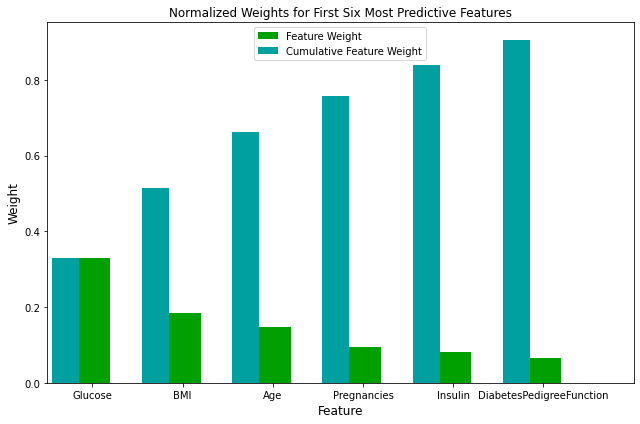

Glucose                       : 33.04%
BMI                           : 18.50%
Age                           : 14.69%
Pregnancies                   :  9.51%
Insulin                       :  8.21%
DiabetesPedigreeFunction      :  6.67%
SkinThickness                 :  5.80%
BloodPressure                 :  3.57%

Total importance: 100.00%


In [214]:
forest_model = RandomForestClassifier(n_estimators = 50 ,min_samples_leaf = 10 ,max_depth = 6).fit(X_train,y_train)
importances = forest_model.feature_importances_

feature_plot(importances, X_train, y_train)
feat = get_features(forest_model)

In [254]:
from sklearn.base import clone

X_train_reduced = X_train[[x[0] for x in sorted(feat.items(), key= lambda x: x[1] , reverse=True) if x[1] > 0.0][:6]] 
X_test_reduced = X_test[[x[0] for x in sorted(feat.items(), key= lambda x: x[1] , reverse=True) if x[1] > 0.0][:6]] 
final_model = (clone(best_clf1)).fit(X_train_reduced, y_train)

# Make new predictions
reduced_predictions = final_model.predict(X_test_reduced)

# Report scores from the final model using both versions of data
print("Final Model trained on full data\n------")
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
print("Final F-score on the testing data: {:.4f}".format(fbeta_score(y_test, best_predictions, beta = 0.5)))
print("\nFinal Model trained on reduced data\n------")
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, reduced_predictions)))
print("Final F-score on the testing data: {:.4f}".format(fbeta_score(y_test, reduced_predictions, beta = 0.5)))

Final Model trained on full data
------
Final accuracy score on the testing data: 0.7338
Final F-score on the testing data: 0.6146

Final Model trained on reduced data
------
Final accuracy score on the testing data: 0.7273
Final F-score on the testing data: 0.6061


In [216]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

clf1 = GradientBoostingClassifier()

parameters = {'n_estimators' : [50,30, 100],
              'min_samples_leaf' : [10,20,50],
             'max_depth': [3,5,6]
             }

grid_obj_forest = GridSearchCV(clf1 , parameters , scoring = make_scorer(fbeta_score , beta=0.5) , n_jobs=-1)
grid_fit_forest = grid_obj_forest.fit(X_train,y_train)
best_clf1 = grid_fit_forest.best_estimator_

predictions = (clf1.fit(X_train, y_train)).predict(X_test)
best_predictions = best_clf1.predict(X_test)

print("Unoptimized RandomForest model\n------")
print("Accuracy score on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))
print("F-score on testing data: {:.4f}".format(fbeta_score(y_test, predictions, beta = 0.5)))
print("\nOptimized RandomForest Model\n------")
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
print("Final F-score on the testing data: {:.4f}".format(fbeta_score(y_test, best_predictions, beta = 0.5)))
print("Final Hyperparameters: %s" %grid_fit_forest.best_params_)

Unoptimized RandomForest model
------
Accuracy score on testing data: 0.7468
F-score on testing data: 0.6318

Optimized RandomForest Model
------
Final accuracy score on the testing data: 0.7208
Final F-score on the testing data: 0.5939
Final Hyperparameters: {'max_depth': 6, 'min_samples_leaf': 10, 'n_estimators': 50}


In [219]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

clf1 = LogisticRegression()

parameters = {'C': np.logspace(-3,3,7),
              'penalty':['l1', 'l2']
             }

grid_obj_forest = GridSearchCV(clf1 , parameters , scoring = make_scorer(fbeta_score , beta=0.5) ,cv=10, n_jobs=-1)
grid_fit_forest = grid_obj_forest.fit(X_train,y_train)
best_clf1 = grid_fit_forest.best_estimator_

predictions = (clf1.fit(X_train, y_train)).predict(X_test)
best_predictions = best_clf1.predict(X_test)

print("Unoptimized RandomForest model\n------")
print("Accuracy score on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))
print("F-score on testing data: {:.4f}".format(fbeta_score(y_test, predictions, beta = 0.5)))
print("\nOptimized RandomForest Model\n------")
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
print("Final F-score on the testing data: {:.4f}".format(fbeta_score(y_test, best_predictions, beta = 0.5)))
print("Final Hyperparameters: %s" %grid_fit_forest.best_params_)

Unoptimized RandomForest model
------
Accuracy score on testing data: 0.7338
F-score on testing data: 0.6151

Optimized RandomForest Model
------
Final accuracy score on the testing data: 0.7403
Final F-score on the testing data: 0.6230
Final Hyperparameters: {'C': 0.1, 'penalty': 'l2'}


In [247]:
from sklearn.svm import SVC

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

clf1 = SVC()

parameters = {
              'kernel':['linear', 'rbf']
             }

grid_obj_forest = GridSearchCV(clf1 , parameters , scoring = make_scorer(fbeta_score , beta=0.5) ,cv=10, n_jobs=-1)
grid_fit_forest = grid_obj_forest.fit(X_train,y_train)
best_clf1 = grid_fit_forest.best_estimator_

predictions = (clf1.fit(X_train, y_train)).predict(X_test)
best_predictions = best_clf1.predict(X_test)

print("Unoptimized RandomForest model\n------")
print("Accuracy score on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))
print("F-score on testing data: {:.4f}".format(fbeta_score(y_test, predictions, beta = 0.5)))
print("\nOptimized RandomForest Model\n------")
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
print("Final F-score on the testing data: {:.4f}".format(fbeta_score(y_test, best_predictions, beta = 0.5)))
print("Final Hyperparameters: %s" %grid_fit_forest.best_params_)

Unoptimized RandomForest model
------
Accuracy score on testing data: 0.7532
F-score on testing data: 0.6390

Optimized RandomForest Model
------
Final accuracy score on the testing data: 0.7532
Final F-score on the testing data: 0.6390
Final Hyperparameters: {'kernel': 'rbf'}


In [252]:
from sklearn.base import clone

X_train_reduced = X_train[[x[0] for x in sorted(feat.items(), key= lambda x: x[1] , reverse=True) if x[1] > 0.0][:7]] 
X_test_reduced = X_test[[x[0] for x in sorted(feat.items(), key= lambda x: x[1] , reverse=True) if x[1] > 0.0][:7]] 
final_model = (clone(best_clf1)).fit(X_train_reduced, y_train)

# Make new predictions
reduced_predictions = final_model.predict(X_test_reduced)

# Report scores from the final model using both versions of data
print("Final Model trained on full data\n------")
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
print("Final F-score on the testing data: {:.4f}".format(fbeta_score(y_test, best_predictions, beta = 0.5)))
print("\nFinal Model trained on reduced data\n------")
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, reduced_predictions)))
print("Final F-score on the testing data: {:.4f}".format(fbeta_score(y_test, reduced_predictions, beta = 0.5)))

Final Model trained on full data
------
Final accuracy score on the testing data: 0.7532
Final F-score on the testing data: 0.6390

Final Model trained on reduced data
------
Final accuracy score on the testing data: 0.7597
Final F-score on the testing data: 0.6467
